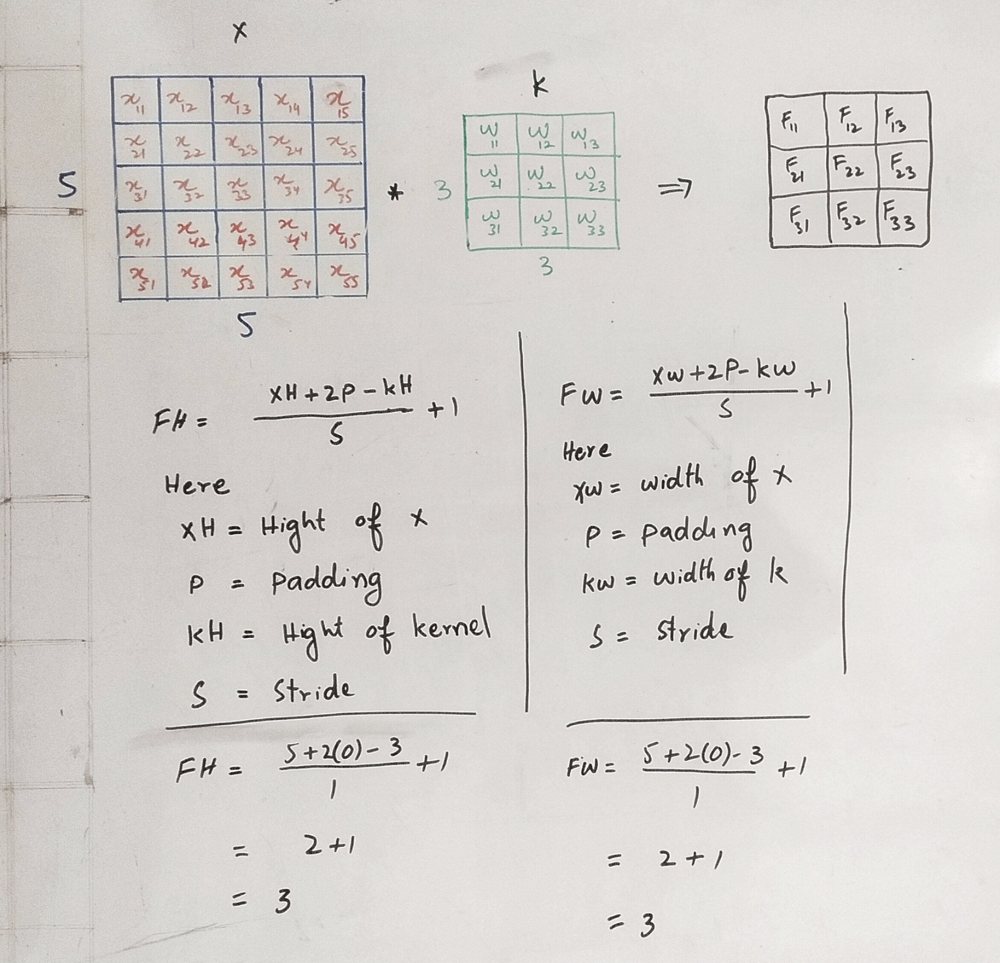

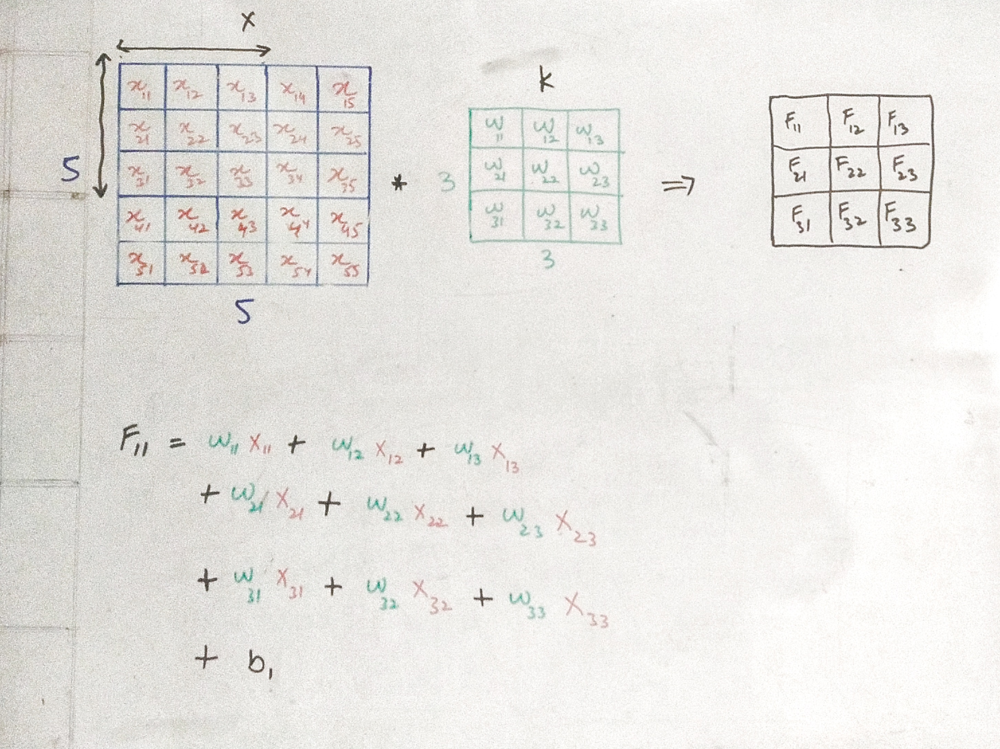

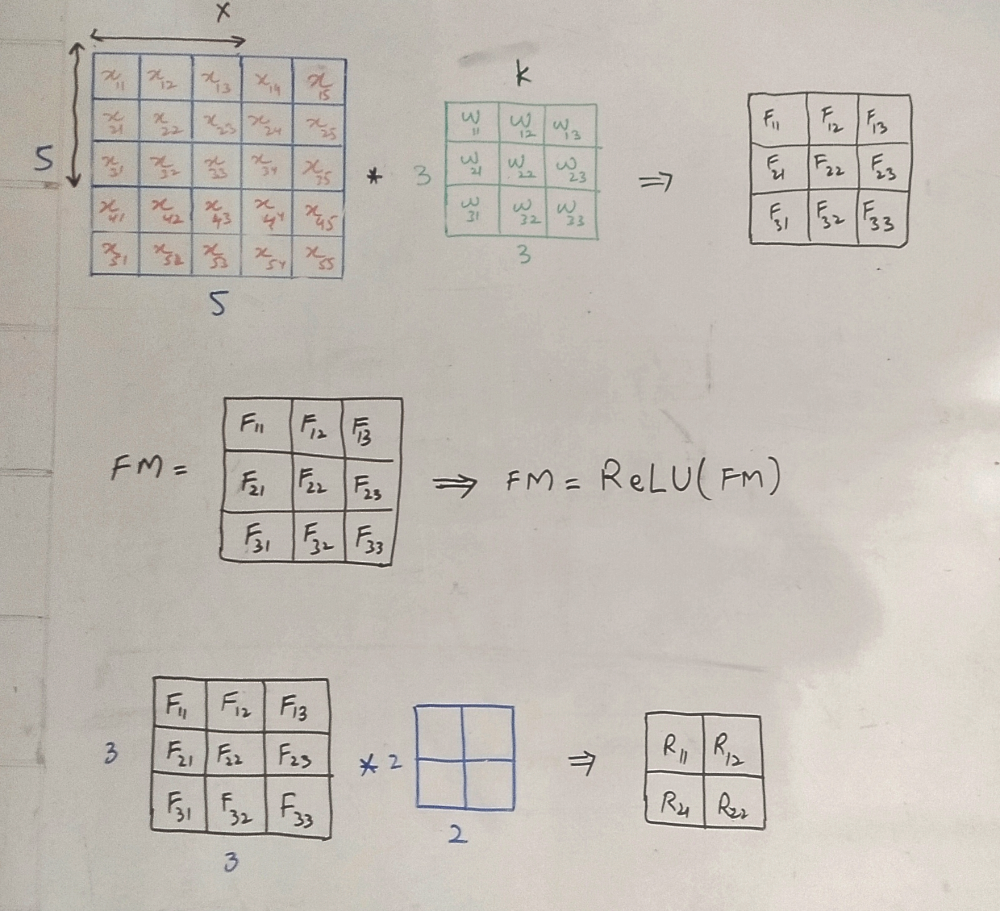

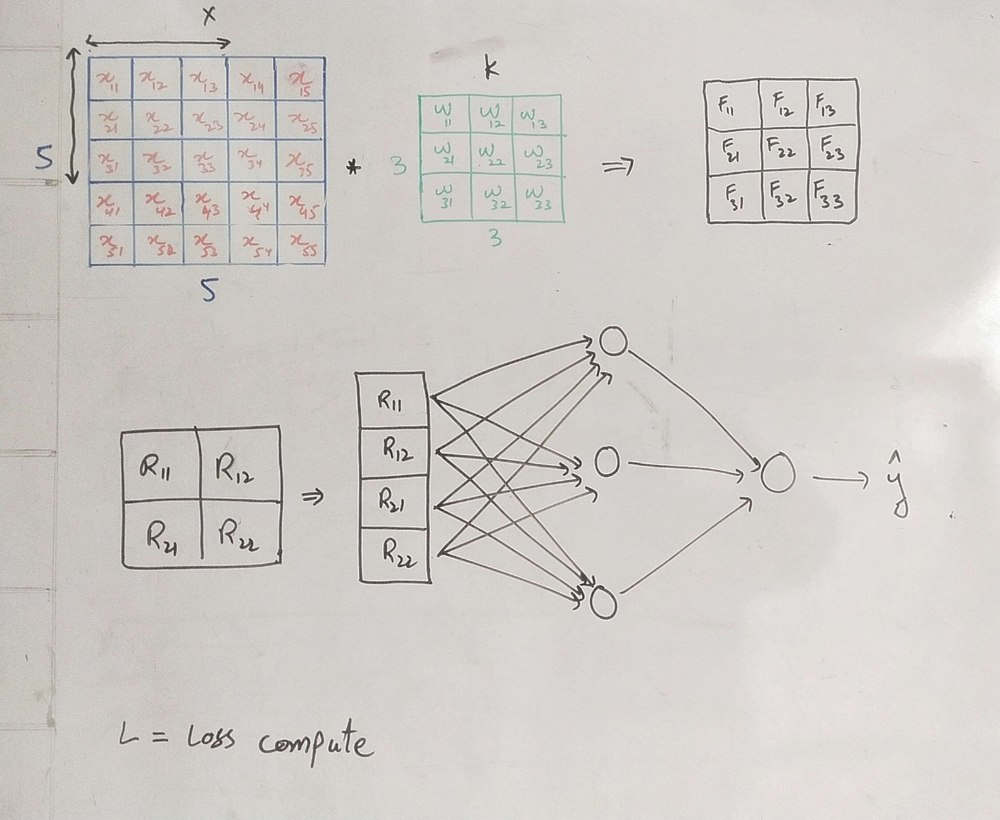

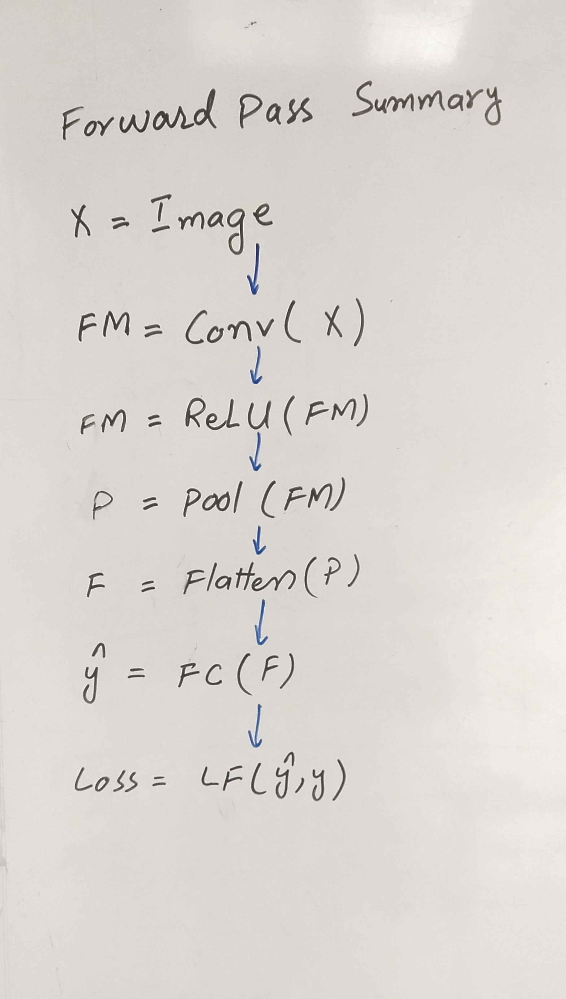

In [ ]:

import torch
import torch.nn as nn
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np


In [ ]:
img = cv.imread("")
img = cv.resize(img, (100, 100)).astype(np.float32)

img_tensor = torch.from_numpy(img).permute(2, 0, 1).unsqueeze(0)


In [ ]:
img_tensor = torch.randn(1,1, 5,5)


In [ ]:
img_tensor

tensor([[[[-1.1612,  0.4496, -0.0154, -1.8712,  0.2037],
          [ 0.1059,  0.1827, -0.0264,  0.6613,  0.7944],
          [ 0.5535,  1.8246,  1.0814, -1.5178,  1.1369],
          [-0.5835,  0.9477, -0.4281, -0.3394,  0.1403],
          [ 0.2283, -0.5169, -0.0103,  0.0409, -1.8426]]]])

In [ ]:
conv1 = nn.Conv2d(in_channels=1, out_channels=1, kernel_size=3)

feature_map = conv1(img_tensor)


In [ ]:
feature_map.shape

torch.Size([1, 1, 7, 7])

In [ ]:
relu = nn.ReLU()
feature_map = relu(feature_map)

In [ ]:
feature_map

tensor([[[[0.0417, 0.0030, 0.4056],
          [0.3664, 0.0000, 0.3338],
          [0.0000, 0.3976, 0.0000]]]], grad_fn=<ReluBackward0>)

In [ ]:
# fmap_0 = feature_map[0, 0].detach().numpy()



In [ ]:
pool = nn.MaxPool2d(kernel_size=2, stride=1)

feature_map = pool(feature_map)

In [ ]:
feature_map

tensor([[[[0.3664, 0.4056],
          [0.3976, 0.3976]]]], grad_fn=<MaxPool2DWithIndicesBackward0>)

In [ ]:
fmap_0 = feature_map[0, 0].detach().numpy()

# plt.imshow(fmap_0)


In [ ]:
feature_map.size(0)

In [ ]:
flattened_vec = feature_map.view(feature_map.size(0), -1)

In [ ]:
flattened_vec

tensor([[0.3664, 0.4056, 0.3976, 0.3976]], grad_fn=<ViewBackward0>)

In [ ]:
fc = nn.Linear(in_features=4, out_features=1)

output = fc(flattened_vec)

In [ ]:
output

tensor([[0.4829]], grad_fn=<AddmmBackward0>)